In [1]:
import nltk
from nltk.corpus import stopwords 
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
nltk.download('stopwords')
import string
import re


[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
import matplotlib.pyplot as plt

In [3]:
#retrieving all the files inside folder 20_newsgroups

import os
folders=os.listdir('20_newsgroups/')
filelist=[]
doc=[]
# count=0
for directory in folders:
    files=os.listdir('20_newsgroups/'+directory)
    for i in files:
        doc.append(i)
    for file in files:
        f=open('20_newsgroups/'+directory+"/"+file)
        myfile=f.read()
        myfile=myfile.lower()
        myfile=myfile.translate(str.maketrans(" "," ",string.punctuation))
#         myfile=re.sub(r"\d+","",myfile)
        filelist.append(myfile)
    
#doc contains all the document list
#filelist is a list of list where each list conatins one file

In [4]:
#tf_dict contains each doc as key and a dictionary of (terms, tf) values for each document as value
#idf_dict contains each term as key and ifd value as value
#vocab1 contains all the vocabulary terms
#finallist is list of list where each list contains lemmatized tokens corresponding to each file

import pickle
from num2words import num2words
lem=WordNetLemmatizer()
final_list=[]
idf_dict={}
tf_dict={}
vocab1={}
from nltk.tokenize import word_tokenize   
stop_words = set(stopwords.words('english')) 
index=0
for i in filelist:
    word_tokens = word_tokenize(i)
    mylist = [] 
    for w in word_tokens: 
        if w not in stop_words: 
            mylist.append(w) 
    temp1=[]
    temp2=[]
    for tokens in mylist:
        if(tokens.isdecimal()==True):
            tokens=num2words(tokens)
        word=lem.lemmatize(tokens) 
        temp1.append(word) 
        temp2.append(word)
    temp2=set(temp2)
    for i1 in temp2:
        if i1 not in idf_dict:
            idf_dict[i1]=1
        else:
            idf_dict[i1]=idf_dict[i1]+1 
    temp_dict={}
    for i2 in temp1:
        if i2 not in vocab1:
            vocab1[i2]=1
        if i2 not in temp_dict:
            temp_dict[i2]=temp1.count(i2)
    
    tf_dict[doc[index]]=temp_dict   
    index+=1
    final_list.append(mylist)

In [5]:
#final index is the dictionary where key is document name and value corresponds to a dictionary of size vocabulary with term
#and tf-idf values

import math
final_index={}
for i in tf_dict:
    temp={}
    for j in vocab1:
        if j in tf_dict[i]:
            x=len(doc)/(idf_dict[j] +1)
            idf=math.log(x,10)
            temp[j]=math.log(1+tf_dict[i][j])*idf
        else:
            temp[j]=0
    final_index[i]=temp

In [6]:
print(final_index['58044']['marriott'])

5.0095444959017446


In [7]:
#function for getting top k tuples from a list of tuples

def get_k_tuples(list2,k):
    li2=[]
    li2=sorted(list2, key=lambda t: t[1], reverse=True)[:k]
    return li2

#function to sort a dictionary on the basis of values

def sort_dictionary(list1):
    li=[]
    li=sorted(list1.items(), key = lambda kv:(kv[1], kv[0]))
    return li

In [8]:

#function to find cosine similarity between query vector and the documents and retrieving top k documents

def cosine_similarity(query_vector1,k):
    final_cosine={}
    for d in final_index:
        mul_list=[]
        q_sq_list=[]
        d_sq_list=[]
        for c in query_vector1:
            mul=final_index[d][c]*query_vector1[c]
            mul_list.append(mul)
            qs=query_vector1[c]*query_vector1[c]
            q_sq_list.append(qs)
            ds=final_index[d][c]*final_index[d][c]
            d_sq_list.append(ds)
        s1=0
        s2=0
        s3=0
        s1=sum(mul_list)
        s2=sum(q_sq_list)
        s3=sum(d_sq_list)
        s2=math.sqrt(s2)
        s3=math.sqrt(s3)
        if (s2*s3)!=0:
            fin=s1/(s2*s3)
#             print(fin)
            final_cosine[d]=fin
    list1=[]    
    list1=sort_dictionary(final_cosine)
    output=[]
    output=get_k_tuples(list1,k)
    return output  
    

In [9]:
query_vector={}


#function for initial query preprocessing
def query_preprocessing(query):
    
    query=query.lower()
    query=query.translate(str.maketrans("","",string.punctuation))
    query= word_tokenize(query)
    t=[]
    for w in query:
        if w not in stop_words: 
            t.append(w)
    input_txt=[]
    for i in t:
        if(i.isdecimal()==True):
            i=num2words(i)
        input_txt.append(lem.lemmatize(i))
    for x in input_txt:
        if x not in idf_dict:
            idf_dict[x]=0
    #creating query vector
    for term in vocab1:
        if term in input_txt:
            x=len(doc)/(idf_dict[term] +1)
            idf=math.log(x,10)
            val=math.log(1+input_txt.count(term))*idf
            query_vector[term]=val
        else:
            query_vector[term]=0
    return query_vector
        
    

In [10]:

#function for updating query vector and again finding cosine similarity between new query vector and the documents
#and retrieving top k documents
def rel_feedback(updated_q,rel_doc,non_rel):
    new_q={}
    rel_doc_len=len(rel_doc)
    non_rel_doc_len=len(non_rel)
    for term in updated_q:
        q0=updated_q[term]*1
        temp1=[]
        temp2=[]
        avg1=0
        avg2=0
        final=0
#         for d in doc:
#             if d in rel_doc:
#                 temp1.append(0.7*final_index[d][term])
#             else:
#                 temp2.append(0.25*final_index[d][term])
        for r in rel_doc:
            temp1.append(0.7*final_index[r][term])
        avg1=sum(temp1)/rel_doc_len
        for nr in non_rel:
            temp2.append(0.25*final_index[nr][term])
        avg2=sum(temp2)/non_rel_doc_len
        final=q0+avg1-avg2
        if final<0:
            final=0
            new_q[term]=final
        else:
            new_q[term]=final
    new_ans=cosine_similarity(new_q,k)
#     p,r,m=pre_recall(new_ans,rel_doc)
    return new_ans,new_q
        

In [11]:
#function for calculating map,precision and recall

def pre_recall(list1,rel_doc):
    
    count=0
    rel_count=len(rel_doc)
    rel=0
    pre=[]
    recall=[]
    map1=[]
    for i in range(len(list1)):
        if list1[i][0] in rel_doc:
            rel+=1
            count+=1
            p=rel/count
            r=rel/rel_count
            pre.append(p)
            map1.append(p)
            recall.append(r)
        else:
            count+=1
            p=rel/count
            r=rel/rel_count
            pre.append(p)
            recall.append(r)
    fmap=0
    if len(map1)!=0:
        fmap=sum(map1)/len(map1)
    return pre, recall,fmap

In [106]:
query=input("enter the intial query \n ")
k=int(input("enter the value of k \n"))
ans=query_preprocessing(query)

#final_ans1 conatins top k retrieved documents after initial query
final_ans1=cosine_similarity(ans,k)

print("top ", k, "documents after initial query are: \n", final_ans1)

enter the intial query 
 Frequently asked questions on state-of-the-art visualisation tools
enter the value of k 
120
top  120 documents after initial query are: 
 [('38962', 0.13076521098532082), ('37919', 0.11093199873580913), ('58052', 0.11093199873580913), ('37920', 0.10321402065060155), ('58053', 0.10321402065060155), ('61146', 0.08505313474006876), ('178540', 0.08005457736877879), ('38692', 0.07582754592338617), ('38226', 0.06665390432897685), ('39655', 0.0636203882489307), ('61335', 0.06192241023886999), ('59434', 0.06190672823156369), ('178340', 0.06142282739369062), ('38817', 0.06120212160785284), ('60809', 0.06060212220939798), ('38733', 0.05935757512382941), ('178546', 0.059142043643053324), ('38823', 0.05887415755526643), ('60797', 0.05855598968938008), ('38400', 0.057747406423487885), ('38236', 0.0560706997054576), ('60820', 0.05553465260527318), ('178713', 0.05542982385475616), ('38827', 0.05490181404242343), ('39736', 0.05436291429480169), ('59063', 0.05176385753869066),

In [107]:
print("Initial query vector is : \n",ans)
#final_qv contains the query vectors after each iteration 
final_qv=[]
qv1=[]
for i in ans:
    qv1.append(ans[i])
final_qv.append(qv1)

Initial query vector is : 
 {'xref': 0, 'cantaloupesrvcscmuedu': 0, 'compgraphics37261': 0, 'altgraphics519': 0, 'compgraphicsanimation2614': 0, 'path': 0, 'cantaloupesrvcscmuedudasnewsharvardeduogicseuwmeduzaphodmpsohiostateedudarwinsuranetdtixdtnavymiloasyslipman': 0, 'lipmanoasysdtnavymil': 0, 'robert': 0, 'lipman': 0, 'newsgroups': 0, 'compgraphicsaltgraphicscompgraphicsanimation': 0, 'subject': 0, 'call': 0, 'presentation': 0, 'navy': 0, 'scivizvr': 0, 'seminar': 0, 'messageid': 0, '32850oasysdtnavymil': 0, 'date': 0, 'nineteen': 0, 'mar': 0, 'ninety-three': 0, 'two hundred and one thousand and twenty-three': 0, 'gmt': 0, 'articleid': 0, 'oasys32850': 0, 'expires': 0, 'thirty': 0, 'apr': 0, 'forty thousand': 0, 'replyto': 0, 'followupto': 0, 'compgraphics': 0, 'distribution': 0, 'usa': 0, 'organization': 0, 'carderock': 0, 'division': 0, 'nswc': 0, 'bethesda': 0, 'md': 0, 'line': 0, 'sixty-five': 0, 'scientific': 0, 'visualization': 0, 'virtual': 0, 'reality': 0, 'tuesday': 0, 'ju

In [108]:
print("Enter the ground truth folder: \n")
gt=input()
ground_truth=[]
for d in folders:
    if d == gt:
        files=os.listdir('20_newsgroups/'+d)
        for i in files:
            ground_truth.append(i)
# print(len(ground_truth))    


#out_list1 contains the list of relevant documents after initial query
#out_list1 is used to calculate map,precision and recall for documents retrieved after initial output
out_list1=[]
for i in range(len(final_ans1)):
    x=final_ans1[i][0]
    out_list1.append(x)
# print(out_list1)

p,r,m=pre_recall(final_ans1,ground_truth)
print("precision after initial query are: ",p)
print("recall after initial query are: ",r)
print("MAP after initial query are: ",m)

Enter the ground truth folder: 

sci.med
precision after initial query are:  [0.0, 0.0, 0.3333333333333333, 0.25, 0.4, 0.3333333333333333, 0.2857142857142857, 0.25, 0.2222222222222222, 0.2, 0.18181818181818182, 0.25, 0.23076923076923078, 0.21428571428571427, 0.2, 0.1875, 0.17647058823529413, 0.16666666666666666, 0.15789473684210525, 0.15, 0.14285714285714285, 0.13636363636363635, 0.13043478260869565, 0.125, 0.12, 0.15384615384615385, 0.18518518518518517, 0.17857142857142858, 0.1724137931034483, 0.16666666666666666, 0.16129032258064516, 0.15625, 0.15151515151515152, 0.14705882352941177, 0.14285714285714285, 0.1388888888888889, 0.16216216216216217, 0.18421052631578946, 0.20512820512820512, 0.2, 0.1951219512195122, 0.19047619047619047, 0.18604651162790697, 0.20454545454545456, 0.2, 0.21739130434782608, 0.23404255319148937, 0.22916666666666666, 0.22448979591836735, 0.22, 0.23529411764705882, 0.23076923076923078, 0.22641509433962265, 0.2222222222222222, 0.21818181818181817, 0.23214285714285

In [109]:

map_final1=[]
map_final1.append(m)


Text(0.5, 1.0, ' PR curve after initial query')

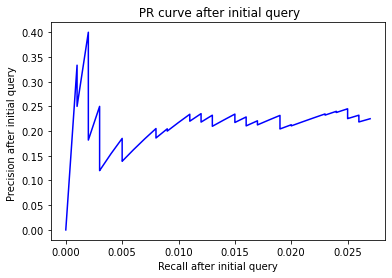

In [110]:

plt.plot(r, p,color="blue")
plt.xlabel("Recall after initial query")
plt.ylabel("Precision after initial query ")
plt.title(" PR curve after initial query")

In [111]:
print(out_list1)

['38962', '37919', '58052', '37920', '58053', '61146', '178540', '38692', '38226', '39655', '61335', '59434', '178340', '38817', '60809', '38733', '178546', '38823', '60797', '38400', '38236', '60820', '178713', '38827', '39736', '59063', '58569', '61079', '38822', '62373', '38497', '60819', '38820', '178450', '178587', '59871', '58139', '59324', '59061', '61456', '178451', '61385', '38824', '59310', '38409', '59100', '59064', '61009', '38636', '38272', '58577', '178695', '38484', '38963', '39495', '59009', '60959', '39055', '60215', '38434', '179047', '178302', '58958', '58844', '61241', '38311', '53908', '38848', '38490', '59185', '178908', '38778', '61568', '61006', '178449', '62406', '59079', '54136', '59904', '38223', '59178', '59026', '178707', '178416', '53556', '61145', '39057', '39053', '61397', '38957', '62126', '54508', '62408', '58838', '53685', '58880', '58868', '59098', '54525', '59087', '39074', '59432', '38916', '38912', '39003', '61000', '39065', '39021', '178453', '39

In [112]:
global_rel=[]

In [113]:
print("Enter the p % of documents you want to mark as relevant \n")
p=int(input())
number_of_rel_docs=(p/100)*k

print("Enter the ", number_of_rel_docs, "documents you want to mark as relevant \n")
rel=input()
#rel_docs1 contains all the documents a user enters as relevant
rel_docs1=rel.split(",")

non_rel_docs1=[]

#non_rel_docs1 contains all the k-p remaining documents which are non relevant

non_rel_docs1=list(set(out_list1)-set(rel_docs1))

#final_docs1 conatins top k retrieved documents after 1st iteration
#new_query1 contains updated query after 1st iteration
final_docs1,new_query1=rel_feedback(query_vector,rel_docs1,non_rel_docs1)
print("docs after 1st iteration are: \n",final_docs1)



Enter the p % of documents you want to mark as relevant 

10
Enter the  12.0 documents you want to mark as relevant 

58052,58053,59434,59063,59310,59100,58577,59009,58958,53908,58838,58880
docs after 1st iteration are: 
 [('37920', 0.38315756771665926), ('58053', 0.38315756771665926), ('37919', 0.3733355940010124), ('58052', 0.3733355940010124), ('59434', 0.32930743070504265), ('61335', 0.32344157150208214), ('58577', 0.2891398674740878), ('59009', 0.26645503028533946), ('58838', 0.25988023903771484), ('58880', 0.2223859650292101), ('59063', 0.21599111761546877), ('58958', 0.2032508565593242), ('59100', 0.19953560862583586), ('59310', 0.1979435520896827), ('59064', 0.14199962769329252), ('58578', 0.14036366134588524), ('61385', 0.13563659484445817), ('58569', 0.1301205187126554), ('59079', 0.12713872422731146), ('59098', 0.12554063168673396), ('59178', 0.12326147113820354), ('53908', 0.12325089806077934), ('59043', 0.12094733640475523), ('61146', 0.11380490601652109), ('59026', 0.1117

In [114]:
global_rel=rel.split(",")

In [115]:
p1,r1,m1=pre_recall(final_docs1,ground_truth)
print("precision after 1st iteration are: ",p1)
print("recall after 1st iteration are: ",r1)
print("MAP after 1st iteration are: ",m1)

precision after 1st iteration are:  [0.0, 0.5, 0.3333333333333333, 0.5, 0.6, 0.5, 0.5714285714285714, 0.625, 0.6666666666666666, 0.7, 0.7272727272727273, 0.75, 0.7692307692307693, 0.7857142857142857, 0.8, 0.8125, 0.7647058823529411, 0.7777777777777778, 0.7894736842105263, 0.8, 0.8095238095238095, 0.7727272727272727, 0.782608695652174, 0.75, 0.76, 0.7307692307692307, 0.7407407407407407, 0.75, 0.7586206896551724, 0.7333333333333333, 0.7096774193548387, 0.6875, 0.696969696969697, 0.6764705882352942, 0.6571428571428571, 0.6388888888888888, 0.6216216216216216, 0.6052631578947368, 0.6153846153846154, 0.6, 0.5853658536585366, 0.5714285714285714, 0.5581395348837209, 0.5454545454545454, 0.5333333333333333, 0.5434782608695652, 0.5319148936170213, 0.5208333333333334, 0.5102040816326531, 0.5, 0.49019607843137253, 0.4807692307692308, 0.49056603773584906, 0.5, 0.4909090909090909, 0.48214285714285715, 0.47368421052631576, 0.46551724137931033, 0.4576271186440678, 0.45, 0.45901639344262296, 0.467741935

In [116]:

qv2=[]
for i in new_query1:
    qv2.append(new_query1[i])
# print(qv2)
final_qv.append(qv2)

In [117]:
print("New query vector after 1st iteration is \n", new_query1)

New query vector after 1st iteration is 
 {'xref': 0.04641881582376725, 'cantaloupesrvcscmuedu': 0.04641881582376725, 'compgraphics37261': 0.0, 'altgraphics519': 0.0, 'compgraphicsanimation2614': 0.0, 'path': 0, 'cantaloupesrvcscmuedudasnewsharvardeduogicseuwmeduzaphodmpsohiostateedudarwinsuranetdtixdtnavymiloasyslipman': 0.0, 'lipmanoasysdtnavymil': 0.0, 'robert': 0, 'lipman': 0.0, 'newsgroups': 0, 'compgraphicsaltgraphicscompgraphicsanimation': 0.0, 'subject': 0, 'call': 0.2008103441123436, 'presentation': 0, 'navy': 0.0, 'scivizvr': 0.0, 'seminar': 0.0, 'messageid': 0, '32850oasysdtnavymil': 0.0, 'date': 0, 'nineteen': 0.02601464125578079, 'mar': 0, 'ninety-three': 0.08586886564028003, 'two hundred and one thousand and twenty-three': 0.0, 'gmt': 0.019317094933789265, 'articleid': 0, 'oasys32850': 0.0, 'expires': 0.0663051456971498, 'thirty': 0, 'apr': 0.009888641048300988, 'forty thousand': 0.0, 'replyto': 0.02508134953917896, 'followupto': 0.11430391167690865, 'compgraphics': 0, 'd

In [118]:
print(len(final_qv))
map_final1.append(m1)

2


Text(0.5, 1.0, ' PR curve after 1st iteration')

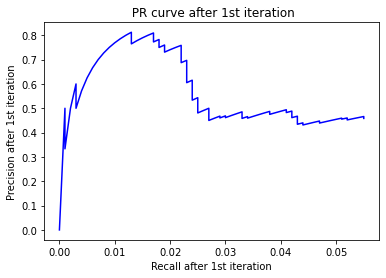

In [119]:
import matplotlib.pyplot as plt

plt.plot(r1, p1,color="blue")
plt.xlabel("Recall after 1st iteration")
plt.ylabel("Precision after 1st iteration")
plt.title(" PR curve after 1st iteration")

In [120]:
out_list2=[]
for i in range(len(final_docs1)):
    x=final_docs1[i][0]
    out_list2.append(x)
    
print(out_list2)

['37920', '58053', '37919', '58052', '59434', '61335', '58577', '59009', '58838', '58880', '59063', '58958', '59100', '59310', '59064', '58578', '61385', '58569', '59079', '59098', '59178', '53908', '59043', '61146', '59026', '38962', '58568', '58885', '59238', '38376', '38853', '38733', '58139', '38778', '38403', '39638', '178571', '39078', '59432', '38692', '54086', '38375', '38852', '178540', '178908', '59183', '179073', '38848', '38226', '38377', '59873', '38851', '58109', '59256', '59871', '178547', '178546', '179058', '59872', '178293', '58761', '59234', '176960', '59459', '179034', '58849', '59637', '59165', '60809', '60820', '61241', '178314', '59189', '179054', '59347', '59087', '58984', '58916', '176944', '178340', '59125', '59123', '58897', '38506', '60797', '59286', '59848', '61418', '60215', '178550', '61079', '59028', '178587', '38897', '178786', '62406', '38636', '53468', '178713', '59284', '39736', '38665', '59444', '58781', '59162', '61456', '178382', '58907', '59301',

In [121]:
startlist1=[]
for i in range(len(final_docs1)):
    x=final_docs1[i][0]
    if x in rel_docs1:
        l=x + "*"
        startlist1.append(l)
    else:
        startlist1.append(x)
    
# print(out_list4)
print("docs after 1st iteration are: ",startlist1)

docs after 1st iteration are:  ['37920', '58053*', '37919', '58052*', '59434*', '61335', '58577*', '59009*', '58838*', '58880*', '59063*', '58958*', '59100*', '59310*', '59064', '58578', '61385', '58569', '59079', '59098', '59178', '53908*', '59043', '61146', '59026', '38962', '58568', '58885', '59238', '38376', '38853', '38733', '58139', '38778', '38403', '39638', '178571', '39078', '59432', '38692', '54086', '38375', '38852', '178540', '178908', '59183', '179073', '38848', '38226', '38377', '59873', '38851', '58109', '59256', '59871', '178547', '178546', '179058', '59872', '178293', '58761', '59234', '176960', '59459', '179034', '58849', '59637', '59165', '60809', '60820', '61241', '178314', '59189', '179054', '59347', '59087', '58984', '58916', '176944', '178340', '59125', '59123', '58897', '38506', '60797', '59286', '59848', '61418', '60215', '178550', '61079', '59028', '178587', '38897', '178786', '62406', '38636', '53468', '178713', '59284', '39736', '38665', '59444', '58781', '5

In [122]:
print("Enter the ", number_of_rel_docs, "documents you want to mark as relevant \n")
rel1=input()

#rel_docs2 contains all the documents a user enters as relevant
#non_rel_docs2 contains all the k-p remaining documents which are non relevant

#final_docs2 conatins top k retrieved documents after 2nd iteration
#new_query2 contains updated query after 2nd iteration
rel_docs2=rel1.split(",")
for i in rel_docs1:
    global_rel.append(i)
non_rel_docs2=[]
temp=list(set(out_list2)-set(rel_docs2))
for docs in temp:
    if docs not in global_rel:
        non_rel_docs2.append(docs)

final_docs2,new_query2=rel_feedback(new_query1,rel_docs2,non_rel_docs2)
print("docs after 2nd iteration are: ",final_docs2)
print("\n")




Enter the  12.0 documents you want to mark as relevant 

59064,58578,59043,59432,58139,59183,59871,59189,59459,58849,58897,58152
docs after 2nd iteration are:  [('59183', 0.5008814925300872), ('58578', 0.4890096719180433), ('58152', 0.37691776200689014), ('59871', 0.34813427245948897), ('59165', 0.319492727614625), ('59459', 0.3113440317028118), ('58897', 0.29823311916563355), ('59432', 0.28161101861647253), ('58577', 0.27754893332164954), ('58849', 0.27683557675278125), ('58850', 0.2692998442667209), ('59189', 0.2649828978261223), ('59234', 0.25750136173400706), ('58826', 0.23706884432462927), ('58139', 0.2260541770020511), ('58907', 0.21415385922778787), ('37920', 0.2135014473218872), ('58053', 0.2135014473218872), ('58838', 0.21278489078930793), ('59034', 0.2109849900180376), ('59009', 0.20820587809310306), ('37919', 0.20465825877725002), ('58052', 0.20465825877725002), ('59043', 0.20263061226265314), ('59069', 0.2006914970373562), ('59434', 0.19939698824929353), ('59064', 0.1992617

In [123]:
p2,r2,m2=pre_recall(final_docs2,ground_truth)
print("precision after 2nd iteration are: ",p2)
print("\n")
print("recall after 2nd iteration are: ",r2)
print("\n")
print("MAP after 2nd iteration is: ",m2)

precision after 2nd iteration are:  [1.0, 1.0, 1.0, 0.75, 0.8, 0.8333333333333334, 0.8571428571428571, 0.875, 0.8888888888888888, 0.9, 0.9090909090909091, 0.9166666666666666, 0.9230769230769231, 0.9285714285714286, 0.9333333333333333, 0.9375, 0.8823529411764706, 0.8888888888888888, 0.8947368421052632, 0.9, 0.9047619047619048, 0.8636363636363636, 0.8695652173913043, 0.875, 0.88, 0.8846153846153846, 0.8888888888888888, 0.8928571428571429, 0.896551724137931, 0.8666666666666667, 0.8709677419354839, 0.875, 0.8787878787878788, 0.8823529411764706, 0.8857142857142857, 0.8888888888888888, 0.8918918918918919, 0.8947368421052632, 0.8974358974358975, 0.9, 0.9024390243902439, 0.9047619047619048, 0.9069767441860465, 0.9090909090909091, 0.9111111111111111, 0.9130434782608695, 0.9148936170212766, 0.9166666666666666, 0.9183673469387755, 0.92, 0.9215686274509803, 0.9230769230769231, 0.9245283018867925, 0.9259259259259259, 0.9272727272727272, 0.9285714285714286, 0.9298245614035088, 0.9310344827586207, 0.

In [124]:
map_final1.append(m2)

In [125]:
print("New query vector after 2nd iteration is \n", new_query2)

New query vector after 2nd iteration is 
 {'xref': 0.1257484242359618, 'cantaloupesrvcscmuedu': 0.1257484242359618, 'compgraphics37261': 0.0, 'altgraphics519': 0.0, 'compgraphicsanimation2614': 0.0, 'path': 0, 'cantaloupesrvcscmuedudasnewsharvardeduogicseuwmeduzaphodmpsohiostateedudarwinsuranetdtixdtnavymiloasyslipman': 0.0, 'lipmanoasysdtnavymil': 0.0, 'robert': 0.010939186276509423, 'lipman': 0.0, 'newsgroups': 0, 'compgraphicsaltgraphicscompgraphicsanimation': 0.0, 'subject': 0, 'call': 0.3182762317773609, 'presentation': 0, 'navy': 0, 'scivizvr': 0.0, 'seminar': 0.0, 'messageid': 0, '32850oasysdtnavymil': 0.0, 'date': 0, 'nineteen': 0, 'mar': 0.17217600607981995, 'ninety-three': 0.15043229956207765, 'two hundred and one thousand and twenty-three': 0.0, 'gmt': 0.04450513049493109, 'articleid': 0.043800333578108704, 'oasys32850': 0.0, 'expires': 0.19111965882260135, 'thirty': 0, 'apr': 0.01901888876516991, 'forty thousand': 0.0, 'replyto': 0.07688198639055402, 'followupto': 0.2059552

In [126]:

qv3=[]
for i in new_query2:
    qv3.append(new_query2[i])
print(qv3)
final_qv.append(qv3)

[0.1257484242359618, 0.1257484242359618, 0.0, 0.0, 0.0, 0, 0.0, 0.0, 0.010939186276509423, 0.0, 0, 0.0, 0, 0.3182762317773609, 0, 0, 0.0, 0.0, 0, 0.0, 0, 0, 0.17217600607981995, 0.15043229956207765, 0.0, 0.04450513049493109, 0.043800333578108704, 0.0, 0.19111965882260135, 0, 0.01901888876516991, 0.0, 0.07688198639055402, 0.20595526330594505, 0, 0, 0, 0.007535571034893798, 0.0, 0, 0.0, 0, 0.11291552639915796, 0.0009676153965457789, 0, 0.36060227850676607, 0.2987082821439065, 0, 0.033341840550569844, 0, 0.039930690477398695, 0.1408695393327785, 0.0332872469790292, 0, 0.04685838755745085, 0, 0, 0, 0.006970642868426344, 0, 0, 0, 0, 0.0, 0, 0, 0.3573946331146667, 0, 0.0, 0, 0.06350181570399316, 0, 0.3419264861526957, 0.0, 0.022940308301213186, 0.0070497253763939505, 0, 0.0, 0.039064876902744274, 0.06272401622737182, 0.2602131202353888, 0.0, 0.037394091491411374, 0.08741321687133699, 0.2561406706446597, 0.39835996957656983, 0.20181881359255036, 0.2540371105076746, 0.12312833996906943, 0.0, 0

In [127]:
print(len(final_qv))

3


Text(0.5, 1.0, ' PR curve after 2nd iteration')

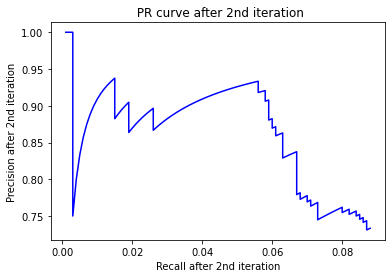

In [128]:
plt.plot(r2, p2,color="blue")
plt.xlabel("Recall after 2nd iteration")
plt.ylabel("Precision after 2nd iteration")
plt.title(" PR curve after 2nd iteration")

In [129]:
print(len(final_qv))

3


In [130]:
out_list3=[]
for i in range(len(final_docs2)):
    x=final_docs2[i][0]
    out_list3.append(x)
    
print(out_list3)



['59183', '58578', '58152', '59871', '59165', '59459', '58897', '59432', '58577', '58849', '58850', '59189', '59234', '58826', '58139', '58907', '37920', '58053', '58838', '59034', '59009', '37919', '58052', '59043', '59069', '59434', '59064', '59255', '58984', '61335', '59063', '59100', '59049', '59554', '58569', '59338', '58874', '58568', '58880', '59333', '59323', '59238', '59499', '59332', '59488', '59632', '59256', '59209', '59322', '59178', '59527', '59079', '58109', '59123', '59284', '59304', '59044', '59207', '58781', '59395', '179058', '59518', '59241', '38403', '59202', '59848', '39638', '59286', '39078', '59160', '61435', '59380', '59548', '59905', '178571', '178293', '59228', '59318', '59470', '59637', '59873', '178786', '59872', '176960', '179073', '61146', '59456', '38778', '59490', '59224', '61049', '59310', '59874', '58953', '59168', '38853', '38376', '178908', '59098', '58910', '58155', '59206', '59347', '59071', '59125', '59850', '59252', '58941', '178314', '58958', '

In [131]:
startlist2=[]
for i in range(len(final_docs2)):
    x=final_docs2[i][0]
    if x in rel_docs2:
        l=x + "*"
        startlist2.append(l)
    else:
        startlist2.append(x)
    
# print(out_list4)
print("docs after 2nd iteration are: ",startlist2)

docs after 2nd iteration are:  ['59183*', '58578*', '58152*', '59871*', '59165', '59459*', '58897*', '59432*', '58577', '58849*', '58850', '59189*', '59234', '58826', '58139*', '58907', '37920', '58053', '58838', '59034', '59009', '37919', '58052', '59043*', '59069', '59434', '59064*', '59255', '58984', '61335', '59063', '59100', '59049', '59554', '58569', '59338', '58874', '58568', '58880', '59333', '59323', '59238', '59499', '59332', '59488', '59632', '59256', '59209', '59322', '59178', '59527', '59079', '58109', '59123', '59284', '59304', '59044', '59207', '58781', '59395', '179058', '59518', '59241', '38403', '59202', '59848', '39638', '59286', '39078', '59160', '61435', '59380', '59548', '59905', '178571', '178293', '59228', '59318', '59470', '59637', '59873', '178786', '59872', '176960', '179073', '61146', '59456', '38778', '59490', '59224', '61049', '59310', '59874', '58953', '59168', '38853', '38376', '178908', '59098', '58910', '58155', '59206', '59347', '59071', '59125', '598

In [133]:
print("Enter the ", number_of_rel_docs, "documents you want to mark as relevant \n")

#rel_docs3 contains all the documents a user enters as relevant
#non_rel_docs3 contains all the k-p remaining documents which are non relevant

#final_docs3 conatins top k retrieved documents after 3rd iteration
#new_query3 contains updated query after 3rd iteration
rel2=input()
rel_docs3=rel2.split(",")
for i in rel_docs2:
    global_rel.append(i)
non_rel_docs3=[]
temp1=list(set(out_list3)-set(rel_docs3))
for docs in temp1:
    if docs not in global_rel:
        non_rel_docs3.append(docs)
final_docs3,new_query3=rel_feedback(new_query2,rel_docs3,non_rel_docs3)
print("docs after 3rd iteration are: ",final_docs3)
print("\n")


Enter the  12.0 documents you want to mark as relevant 

58577,58838,58984,59049,59256,59241,59202,59873,59310,59874,59098,59031
docs after 3rd iteration are:  [('59874', 0.43792731001518076), ('58578', 0.42600457231324373), ('59183', 0.42300062363883045), ('59873', 0.37500597719055856), ('59871', 0.35884957274884494), ('58897', 0.3261536979063995), ('58984', 0.32025344140969003), ('58577', 0.31842130000655927), ('59256', 0.3084064732997529), ('58152', 0.3046479024821894), ('58907', 0.2868579133869832), ('59049', 0.275727436493768), ('58850', 0.27268437654485167), ('59069', 0.27107368740575216), ('59165', 0.27033520652606596), ('58849', 0.25660030084100416), ('58838', 0.25543257034906725), ('59034', 0.2551376057227737), ('59459', 0.2399595209161226), ('59202', 0.2366611582849465), ('58826', 0.23362607142971384), ('59189', 0.23160310860478728), ('59234', 0.23109129833543174), ('59432', 0.22568690544655626), ('59241', 0.2235506991300974), ('59009', 0.211144761253313), ('59031', 0.2095472

In [134]:
p3,r3,m3=pre_recall(final_docs3,ground_truth)
print("precision after 3rd iteration are: ",p3)
print("\n")
print("recall after 3rd iteration are: ",r3)
print("\n")
print("MAP after 3rd iteration is: ",m3)


precision after 3rd iteration are:  [0.0, 0.5, 0.6666666666666666, 0.5, 0.4, 0.5, 0.5714285714285714, 0.625, 0.6666666666666666, 0.7, 0.7272727272727273, 0.75, 0.7692307692307693, 0.7857142857142857, 0.8, 0.8125, 0.8235294117647058, 0.8333333333333334, 0.8421052631578947, 0.85, 0.8571428571428571, 0.8636363636363636, 0.8695652173913043, 0.875, 0.88, 0.8846153846153846, 0.8888888888888888, 0.8928571428571429, 0.896551724137931, 0.9, 0.9032258064516129, 0.90625, 0.8787878787878788, 0.8823529411764706, 0.8857142857142857, 0.8611111111111112, 0.8378378378378378, 0.8157894736842105, 0.8205128205128205, 0.8, 0.7804878048780488, 0.7619047619047619, 0.7674418604651163, 0.75, 0.7555555555555555, 0.7391304347826086, 0.7446808510638298, 0.75, 0.7551020408163265, 0.74, 0.7254901960784313, 0.7307692307692307, 0.7169811320754716, 0.7037037037037037, 0.6909090909090909, 0.6964285714285714, 0.6842105263157895, 0.6896551724137931, 0.6949152542372882, 0.7, 0.7049180327868853, 0.6935483870967742, 0.68253

In [135]:
map_final1.append(m3)

In [136]:
print("New query vector after 3rd iteration is \n", new_query3)

New query vector after 3rd iteration is 
 {'xref': 0.2066655319588635, 'cantaloupesrvcscmuedu': 0.2066655319588635, 'compgraphics37261': 0.0, 'altgraphics519': 0.0, 'compgraphicsanimation2614': 0.0, 'path': 0, 'cantaloupesrvcscmuedudasnewsharvardeduogicseuwmeduzaphodmpsohiostateedudarwinsuranetdtixdtnavymiloasyslipman': 0.0, 'lipmanoasysdtnavymil': 0.0, 'robert': 0.11644175071066559, 'lipman': 0.0, 'newsgroups': 0, 'compgraphicsaltgraphicscompgraphicsanimation': 0.0, 'subject': 0, 'call': 0.5878809485751273, 'presentation': 0.05820703030953499, 'navy': 0, 'scivizvr': 0.0, 'seminar': 0.0, 'messageid': 0, '32850oasysdtnavymil': 0.0, 'date': 0, 'nineteen': 0.09130959430058483, 'mar': 0.2486925993721647, 'ninety-three': 0.193081354738755, 'two hundred and one thousand and twenty-three': 0.0, 'gmt': 0.07402546984839714, 'articleid': 0.03341290269001968, 'oasys32850': 0.0, 'expires': 0.3869018644567147, 'thirty': 0.029089527955846184, 'apr': 0.030256584762795684, 'forty thousand': 0.0, 'repl

In [137]:

qv4=[]

for i in new_query3:
    qv4.append(new_query3[i])
print(qv4)
final_qv.append(qv4)

[0.2066655319588635, 0.2066655319588635, 0.0, 0.0, 0.0, 0, 0.0, 0.0, 0.11644175071066559, 0.0, 0, 0.0, 0, 0.5878809485751273, 0.05820703030953499, 0, 0.0, 0.0, 0, 0.0, 0, 0.09130959430058483, 0.2486925993721647, 0.193081354738755, 0.0, 0.07402546984839714, 0.03341290269001968, 0.0, 0.3869018644567147, 0.029089527955846184, 0.030256584762795684, 0.0, 0.07772821749028264, 0.3510290605369331, 0, 0.0683645917638605, 0.1207505393954661, 0.01150287332393969, 0.0, 0, 0.0, 0, 0.19125100698861092, 0.0013485695644955614, 0, 0.35434961104406115, 0.23067075215850447, 0, 0, 0, 0, 0.22200612756346993, 0.08713204127550814, 0.0761358835006584, 0, 0.0, 0.2820629625028808, 0, 0.030639668437123083, 0, 0.12008888067191678, 0, 0, 0.0, 0.07704721886487481, 0.02804202424753259, 0.49278897084136836, 0.0, 0.0, 0, 0.17622269454419506, 0.06203051008676764, 0.48587999652233216, 0.0, 0.14295659708155353, 0.13694510508603536, 0.11686470357580643, 0.0, 0.07169208131499015, 0.16073045790961632, 0.25079459915632607, 0

In [138]:
print(len(final_qv))

4


Text(0.5, 1.0, 'Precision Recall Curve after 3rd iteration')

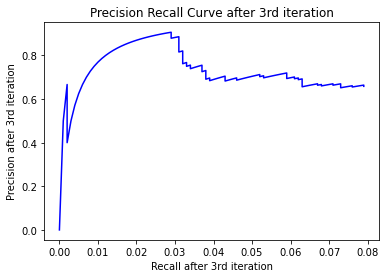

In [139]:
plt.plot(r3, p3,color="blue")
plt.xlabel("Recall after 3rd iteration")
plt.ylabel("Precision after 3rd iteration")
plt.title("Precision Recall Curve after 3rd iteration")

In [140]:
print(len(final_qv))

4


In [141]:
out_list4=[]
for i in range(len(final_docs3)):
    x=final_docs3[i][0]
    out_list4.append(x)
    
print(out_list4)


['59874', '58578', '59183', '59873', '59871', '58897', '58984', '58577', '59256', '58152', '58907', '59049', '58850', '59069', '59165', '58849', '58838', '59034', '59459', '59202', '58826', '59189', '59234', '59432', '59241', '59009', '59031', '59168', '58139', '58569', '58568', '59063', '59872', '59255', '58874', '38853', '38376', '59848', '59043', '59913', '38778', '59905', '59380', '37920', '58053', '61435', '58781', '59098', '59338', '38403', '39638', '59434', '39078', '61146', '61335', '59284', '59870', '59252', '59160', '59554', '59123', '38377', '38851', '59310', '59028', '59238', '37919', '58052', '59527', '59209', '59286', '59499', '59064', '179058', '59488', '61253', '59323', '58833', '58917', '59333', '59179', '59044', '38375', '38852', '176960', '59100', '58109', '61207', '59332', '178571', '58759', '59849', '59850', '59908', '60103', '178293', '59271', '59322', '59303', '59632', '179073', '58880', '61049', '59347', '59228', '59073', '178786', '59548', '59518', '59909', '59

In [142]:
startlist3=[]
for i in range(len(final_docs3)):
    x=final_docs3[i][0]
    if x in rel_docs3:
        l=x + "*"
        startlist3.append(l)
    else:
        startlist3.append(x)
    
# print(out_list4)
print("docs after 3rd iteration are: ",startlist3)

docs after 3rd iteration are:  ['59874*', '58578', '59183', '59873*', '59871', '58897', '58984*', '58577*', '59256*', '58152', '58907', '59049*', '58850', '59069', '59165', '58849', '58838*', '59034', '59459', '59202*', '58826', '59189', '59234', '59432', '59241*', '59009', '59031*', '59168', '58139', '58569', '58568', '59063', '59872', '59255', '58874', '38853', '38376', '59848', '59043', '59913', '38778', '59905', '59380', '37920', '58053', '61435', '58781', '59098*', '59338', '38403', '39638', '59434', '39078', '61146', '61335', '59284', '59870', '59252', '59160', '59554', '59123', '38377', '38851', '59310*', '59028', '59238', '37919', '58052', '59527', '59209', '59286', '59499', '59064', '179058', '59488', '61253', '59323', '58833', '58917', '59333', '59179', '59044', '38375', '38852', '176960', '59100', '58109', '61207', '59332', '178571', '58759', '59849', '59850', '59908', '60103', '178293', '59271', '59322', '59303', '59632', '179073', '58880', '61049', '59347', '59228', '59073

In [143]:
print("Enter the ", number_of_rel_docs, "documents you want to mark as relevant \n")
rel2=input()
#rel_docs4 contains all the documents a user enters as relevant
#non_rel_docs4 contains all the k-p remaining documents which are non relevant

#final_docs4 conatins top k retrieved documents after 3rd iteration
#new_query4 contains updated query after 3rd iteration
rel_docs4=rel.split(",")
for i in rel_docs3:
    global_rel.append(i)
non_rel_docs4=[]
temp3=list(set(out_list4)-set(rel_docs4))
for docs in temp3:
    if docs not in global_rel:
        non_rel_docs4.append(docs)
final_docs4,new_query4=rel_feedback(new_query3,rel_docs4,non_rel_docs4)
print("docs after 4th iteration are: ",final_docs4)
print("\n")


Enter the  12.0 documents you want to mark as relevant 

59905,58053,58781,38403,59284,59064,59323,59333,59044,59303,59347,59347
docs after 4th iteration are:  [('58578', 0.39726516378862525), ('58577', 0.3671117085865749), ('59874', 0.363176999775656), ('59183', 0.351837219593905), ('59873', 0.3041894595779897), ('59871', 0.3003435295750512), ('58838', 0.29991724793265545), ('58897', 0.2825443901149836), ('58984', 0.28004574639998897), ('59256', 0.27250040563289657), ('58152', 0.26829852017324995), ('59009', 0.2610027636341577), ('37920', 0.25344717599450417), ('58053', 0.25344717599450417), ('58907', 0.24879305714804614), ('37919', 0.2387690103863361), ('58052', 0.2387690103863361), ('58850', 0.23304273976698422), ('59063', 0.23146044135556867), ('58849', 0.22672801851219118), ('59049', 0.22589936458848497), ('59434', 0.22571003570567555), ('59069', 0.22196594749481993), ('61335', 0.22105593508041366), ('59165', 0.2205981404025266), ('59459', 0.21845766638197653), ('59432', 0.2108214

In [144]:
p4,r4,m4=pre_recall(final_docs4,ground_truth)
print("precision after 4th iteration are: ",p4)
print("\n")
print("recall after 4th iteration are: ",r4)
print("\n")
print("MAP after 4th iteration is: ",m4)



precision after 4th iteration are:  [1.0, 1.0, 0.6666666666666666, 0.75, 0.6, 0.5, 0.5714285714285714, 0.625, 0.6666666666666666, 0.7, 0.7272727272727273, 0.75, 0.6923076923076923, 0.7142857142857143, 0.7333333333333333, 0.6875, 0.7058823529411765, 0.7222222222222222, 0.7368421052631579, 0.75, 0.7619047619047619, 0.7727272727272727, 0.782608695652174, 0.75, 0.76, 0.7692307692307693, 0.7777777777777778, 0.7857142857142857, 0.7931034482758621, 0.8, 0.8064516129032258, 0.8125, 0.8181818181818182, 0.8235294117647058, 0.8285714285714286, 0.8333333333333334, 0.8378378378378378, 0.8421052631578947, 0.8461538461538461, 0.85, 0.8536585365853658, 0.8571428571428571, 0.8604651162790697, 0.8636363636363636, 0.8666666666666667, 0.8695652173913043, 0.8723404255319149, 0.875, 0.8571428571428571, 0.86, 0.8431372549019608, 0.8461538461538461, 0.8490566037735849, 0.8518518518518519, 0.8545454545454545, 0.8571428571428571, 0.8421052631578947, 0.8275862068965517, 0.8135593220338984, 0.8166666666666667, 0.

In [145]:
map_final1.append(m4)

In [146]:
startlist4=[]
for i in range(len(final_docs4)):
    x=final_docs4[i][0]
    if x in rel_docs4:
        l=x + "*"
        startlist4.append(l)
    else:
        startlist4.append(x)
    
# print(out_list4)
print("docs after 4th iteration are: ",startlist4)

docs after 4th iteration are:  ['58578', '58577*', '59874', '59183', '59873', '59871', '58838*', '58897', '58984', '59256', '58152', '59009*', '37920', '58053*', '58907', '37919', '58052*', '58850', '59063*', '58849', '59049', '59434*', '59069', '61335', '59165', '59459', '59432', '59034', '59202', '58826', '59189', '59310*', '59234', '59031', '59100*', '59043', '59241', '58880*', '59098', '58139', '58569', '59064', '58568', '59168', '59238', '58874', '59255', '58781', '59872', '59028', '61146', '59380', '59079', '58958*', '59178', '59026', '38853', '38376', '38778', '59160', '58833', '59848', '59913', '59252', '59338', '58917', '59554', '58109', '59905', '59870', '59209', '59527', '58759', '59284', '39638', '38403', '39078', '61435', '59123', '38377', '59044', '38851', '59303', '59323', '59179', '59113', '59499', '59488', '59073', '59286', '179058', '38733', '59271', '58834', '178571', '176960', '59363', '59131', '59133', '59228', '59347', '58785', '179073', '59333', '61049', '178786'

In [147]:
final_star=[]
for i in range(len(final_docs4)):
    x=final_docs4[i][0]
    if x in global_rel:
        l=x + "*"
        final_star.append(l)
    else:
        final_star.append(x)
    
# print(out_list4)
print("Relevant documents after 4 iterations are: \n ",final_star)

Relevant documents after 4 iterations are: 
  ['58578*', '58577*', '59874*', '59183*', '59873*', '59871*', '58838*', '58897*', '58984*', '59256*', '58152*', '59009*', '37920', '58053*', '58907', '37919', '58052*', '58850', '59063*', '58849*', '59049*', '59434*', '59069', '61335', '59165', '59459*', '59432*', '59034', '59202*', '58826', '59189*', '59310*', '59234', '59031*', '59100*', '59043*', '59241*', '58880*', '59098*', '58139*', '58569', '59064*', '58568', '59168', '59238', '58874', '59255', '58781', '59872', '59028', '61146', '59380', '59079', '58958*', '59178', '59026', '38853', '38376', '38778', '59160', '58833', '59848', '59913', '59252', '59338', '58917', '59554', '58109', '59905', '59870', '59209', '59527', '58759', '59284', '39638', '38403', '39078', '61435', '59123', '38377', '59044', '38851', '59303', '59323', '59179', '59113', '59499', '59488', '59073', '59286', '179058', '38733', '59271', '58834', '178571', '176960', '59363', '59131', '59133', '59228', '59347', '58785', 

In [148]:
print("New query vector after 4th iteration is \n", new_query4)

New query vector after 4th iteration is 
 {'xref': 0.23722162356030996, 'cantaloupesrvcscmuedu': 0.23722162356030996, 'compgraphics37261': 0.0, 'altgraphics519': 0.0, 'compgraphicsanimation2614': 0.0, 'path': 0, 'cantaloupesrvcscmuedudasnewsharvardeduogicseuwmeduzaphodmpsohiostateedudarwinsuranetdtixdtnavymiloasyslipman': 0.0, 'lipmanoasysdtnavymil': 0.0, 'robert': 0.06682308386150337, 'lipman': 0.0, 'newsgroups': 0, 'compgraphicsaltgraphicscompgraphicsanimation': 0.0, 'subject': 0, 'call': 0.7369963594030335, 'presentation': 0.03516265793912807, 'navy': 0, 'scivizvr': 0.0, 'seminar': 0.0, 'messageid': 0, '32850oasysdtnavymil': 0.0, 'date': 0, 'nineteen': 0.09527142891286816, 'mar': 0.1479300108598552, 'ninety-three': 0.2779769268118479, 'two hundred and one thousand and twenty-three': 0.0, 'gmt': 0.09221946369333615, 'articleid': 0.020574504963168084, 'oasys32850': 0.0, 'expires': 0.3979219876819391, 'thirty': 0, 'apr': 0.03918332855748826, 'forty thousand': 0.0, 'replyto': 0.10366662

In [149]:

qv5=[]

for i in new_query4:
    qv5.append(new_query4[i])
final_qv.append(qv5)

In [150]:
print(len(final_qv))

5


Text(0.5, 1.0, 'Precision Recall Curve')

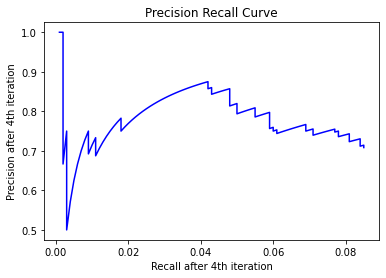

In [151]:
plt.plot(r4, p4,color="blue")
plt.xlabel("Recall after 4th iteration")
plt.ylabel("Precision after 4th iteration")
plt.title("Precision Recall Curve")

[0.22934867106598114, 0.5756985745719785, 0.8662607082356256, 0.7352513287724209, 0.7853508503309906]


Text(0.5, 1.0, 'Different MAP values after each iteration')

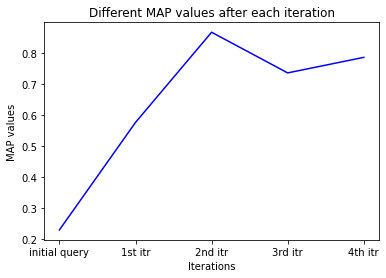

In [152]:
print(map_final1)
iterations=['initial query','1st itr','2nd itr','3rd itr','4th itr']
plt.plot(iterations, map_final1,color="blue")
plt.xlabel("Iterations")
plt.ylabel("MAP values")
plt.title("Different MAP values after each iteration")

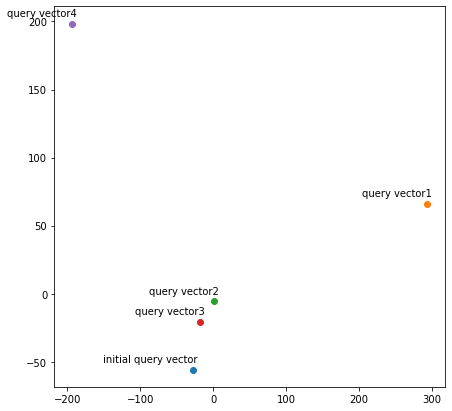

In [153]:
from sklearn.manifold import TSNE
labels=['initial query vector','query vector1', 'query vector2','query vector3','query vector4']
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=250, random_state=23)
new_values = tsne_model.fit_transform(final_qv)

x = []
y = []
for value in new_values:
    x.append(value[0])
    y.append(value[1])
        
plt.figure(figsize=(7,7)) 
for i in range(len(x)):
    plt.scatter(x[i],y[i])
    plt.annotate(labels[i],xy=(x[i], y[i]),xytext=(5, 5),textcoords='offset points',ha='right',va='bottom')
plt.show()